<a href="https://colab.research.google.com/github/kocurvik/edu/blob/master/THRISS/05_exercise_nico_stereo_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Exercises - Nico Stereo Vision + Deep Learning

In this exercise you will obtain pointcloud for images captured by NICO's cameras. We first have to calibrate the cameras. This is slightly more complicated than calibrating a single camera as we need pictures of the calibration pattern captured by both cameras at the same time.

In this exercise we will use data captured byt Matej Palider for his bachelor's thesis.

In [ ]:
!wget http://cogsci.dai.fmph.uniba.sk/~kocur/nico_calib_data.zip
!unzip nico_calib_data.zip

--2024-06-10 13:50:58--  http://cogsci.dai.fmph.uniba.sk/~kocur/nico_calib_data.zip
Resolving cogsci.dai.fmph.uniba.sk (cogsci.dai.fmph.uniba.sk)... 158.195.89.86
Connecting to cogsci.dai.fmph.uniba.sk (cogsci.dai.fmph.uniba.sk)|158.195.89.86|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 239621721 (229M) [application/zip]
Saving to: ‘nico_calib_data.zip’

nico_calib_data.zip 100%[===================>] 228.52M  7.07MB/s    in 33s     

2024-06-10 13:51:31 (6.89 MB/s) - ‘nico_calib_data.zip’ saved [239621721/239621721]

Archive:  nico_calib_data.zip
  inflating: calibration/0_l.png     
  inflating: calibration/0_r.png     
  inflating: calibration/10_l.png    
  inflating: calibration/10_r.png    
  inflating: calibration/11_l.png    
  inflating: calibration/11_r.png    
  inflating: calibration/12_l.png    
  inflating: calibration/12_r.png    
  inflating: calibration/13_l.png    
  inflating: calibration/13_r.png    
  inflating: calibration/14_l.png    
 

## Stereocalibration

Since NICO's cameras have field of view larger than 180 degrees we need to use the OpenCV omnidir stereo calibration. If you want more information you can find in this [OpenCV tutorial](https://docs.opencv.org/4.10.0/dd/d12/tutorial_omnidir_calib_main.html). If you have standard cameras then you can use a similar approach using the standard OpenCV [stereoCalibrate](https://docs.opencv.org/4.x/d9/d0c/group__calib3d.html#ga91018d80e2a93ade37539f01e6f07de5).

In [ ]:
import glob
import numpy as np
import cv2
from matplotlib import pyplot as plt

Finding calibration patterns


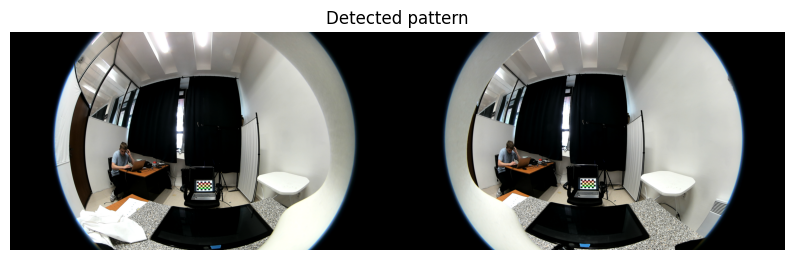

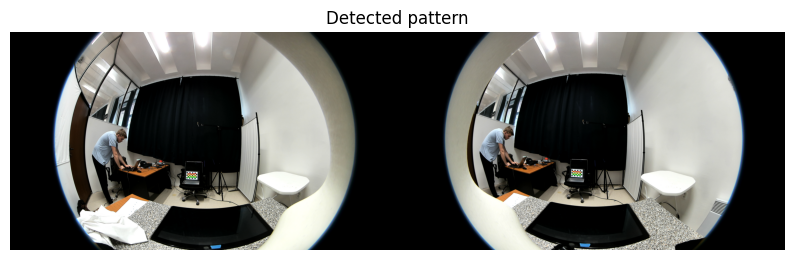

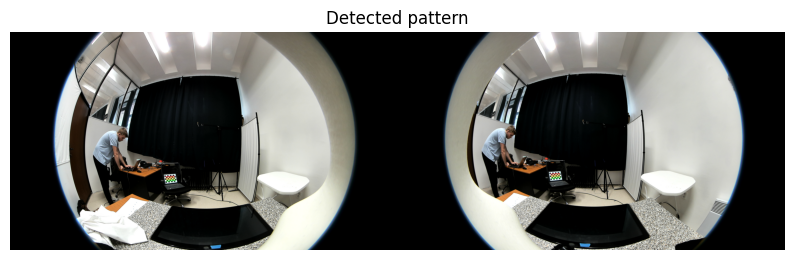

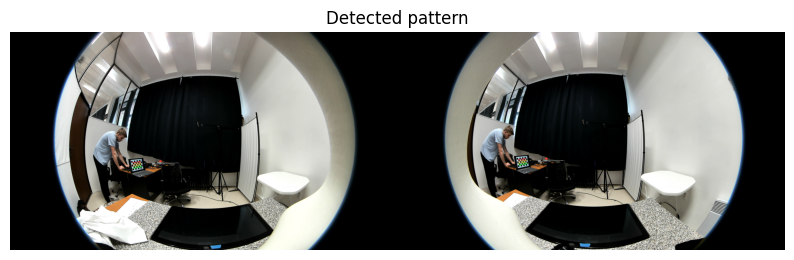

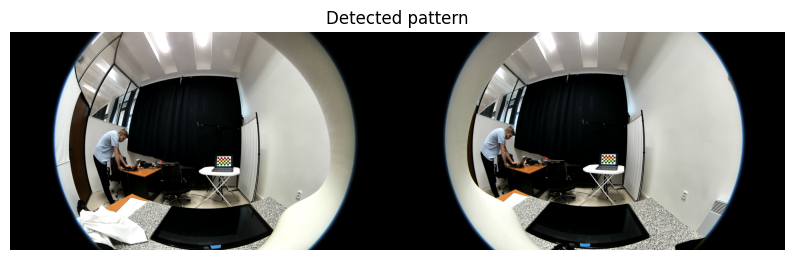

...

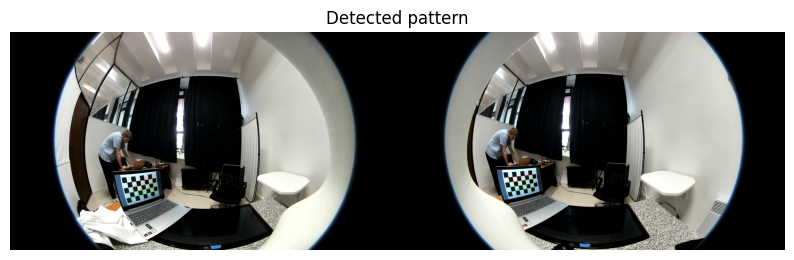

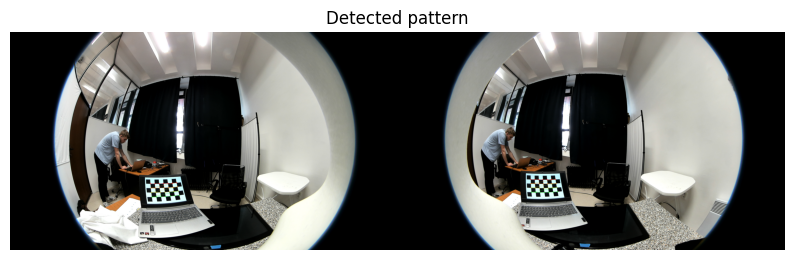

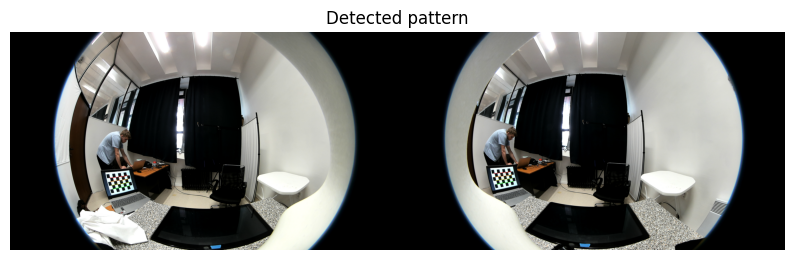

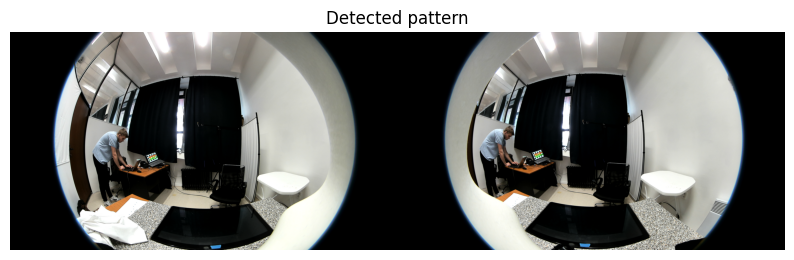

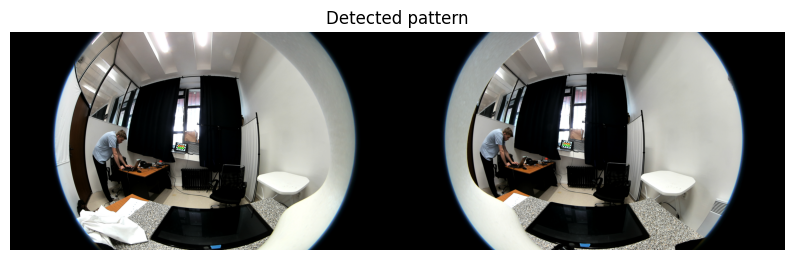

Calibrating camera
Relative pose of the second camera w.r.t. first camera
Rotation:
R
Translation: [[-74.01480059  -2.11555845 -17.21965372]]
Camera distance:  76.0209363805423
Position of the camera center: [[74.08318401]
 [ 1.6305266 ]
 [16.97663093]]


In [ ]:
def get_l_r_image_fnames(calib_img_folder, max_imgs=None):
    glob_string_l = '{}/*l*.png'.format(calib_img_folder)
    glob_string_r = '{}/*r*.png'.format(calib_img_folder)
    images_l = sorted(glob.glob(glob_string_l))
    images_r = sorted(glob.glob(glob_string_r))

    if max_imgs is not None:
        images_l = images_l[:max_imgs]
        images_r = images_r[:max_imgs]

    return images_l, images_r

# we set the dimensions of the calibration pattern
chessboard_x = 7
chessboard_y = 4
# we set the size of the squares
chessboard_dim = 32
calib_img_folder = 'calibration'

obj_coords = np.zeros((chessboard_x * chessboard_y, 3), np.float32)
obj_coords[:, :2] = chessboard_dim * np.mgrid[0:chessboard_x, 0:chessboard_y].T.reshape(-1, 2)

obj_pts = []
img_pts_l = []
img_pts_r = []

images_l, images_r = get_l_r_image_fnames(calib_img_folder)

criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

print("Finding calibration patterns")
for fname_l, fname_r in zip(images_l, images_r):
    img_l = cv2.imread(fname_l)
    gray_l = cv2.cvtColor(img_l, cv2.COLOR_BGR2GRAY)
    ret_l, corners_l = cv2.findChessboardCorners(gray_l, (chessboard_x, chessboard_y), None)

    img_r = cv2.imread(fname_r)
    gray_r = cv2.cvtColor(img_r, cv2.COLOR_BGR2GRAY)
    ret_r, corners_r = cv2.findChessboardCorners(gray_r, (chessboard_x, chessboard_y), None)

    if ret_r and ret_l:
        obj_pts.append(obj_coords)
        corners_l = cv2.cornerSubPix(gray_l, corners_l, (11, 11), (-1, -1), criteria)
        corners_r = cv2.cornerSubPix(gray_r, corners_r, (11, 11), (-1, -1), criteria)
        img_pts_l.append(corners_l)
        img_pts_r.append(corners_r)

        cv2.drawChessboardCorners(img_l, (chessboard_x, chessboard_y), corners_l, ret_l)
        cv2.drawChessboardCorners(img_r, (chessboard_x, chessboard_y), corners_r, ret_r)
        plt.figure(figsize=(10, 4))
        plt.imshow(np.column_stack([img_l, img_r])[:, :, ::-1])
        plt.title("Detected pattern")
        plt.axis("off")
        plt.show()

    else:
        print("Did not find the chessboard in: ", fname_l, fname_r)

obj_pts = np.expand_dims(np.array(obj_pts, dtype=np.float64), -3)
img_pts_l = np.array(img_pts_l, dtype=np.float64)
img_pts_r = np.array(img_pts_r, dtype=np.float64)

img_dim_l = (img_l.shape[1], img_l.shape[0])
img_dim_r = (img_r.shape[1], img_r.shape[0])

print("Calibrating camera")
retval, objectPoints, imagePoints1, imagePoints2, K_l, xi_l, D_l, K_r, xi_r, D_r, rvec, tvec, rvecs_L, tvecs_L, idx = cv2.omnidir.stereoCalibrate(obj_pts, img_pts_l, img_pts_r, img_dim_l, img_dim_r, None, None, None, None, None, None, 0, criteria)

print("Relative pose of the second camera w.r.t. first camera")
R = cv2.Rodrigues(rvec)[0]
print("Rotation:")
print("R")
print("Translation:", tvec.T)
print("Camera distance: ", np.linalg.norm(tvec))
print("Position of the camera center:", -R.T @ tvec)

## Rectification

If we want to use the diparity map we need to undo distortion of the images and project the scene using standard perspective. We will also change the rotation of the cameras so that their principal axes are parallel and perpendicular to the baseline.

Rotation of the second camera relative to the first after rectification:
[[ 9.99994702e-01 -3.24611831e-03  2.44285907e-04]
 [ 3.24546870e-03  9.99991316e-01  2.61424615e-03]
 [-2.52769938e-04 -2.61343948e-03  9.99996553e-01]]
Translation of the second relative to the first after rectification:  [[-76.01896987  -0.48641912  -0.24976956]]
Position of the camera center after rectification:
[[ 7.60209364e+01]
 [ 3.68207087e-16]
 [-1.13359107e-15]]
We can also choose a new image size (4x smaller) and custom K
New K
[[240.   0. 480.]
 [  0. 240. 270.]
 [  0.   0.   1.]]


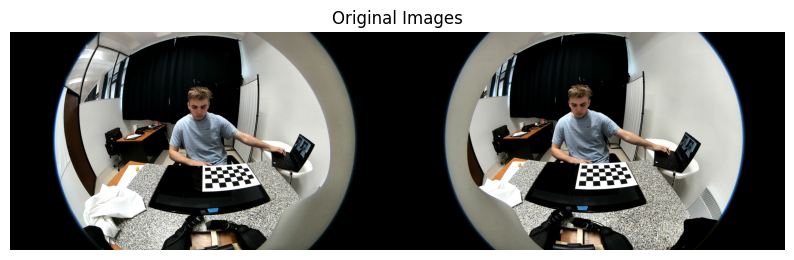

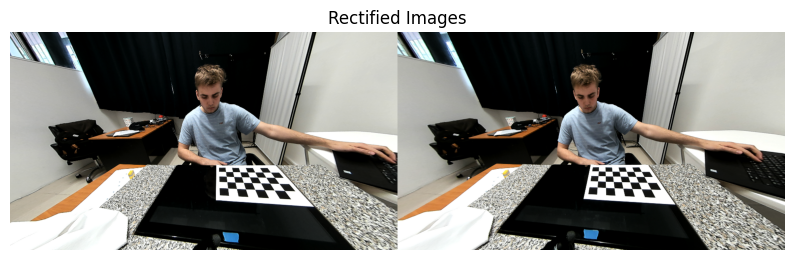

In [ ]:
R_l, R_r = cv2.omnidir.stereoRectify(R, tvec)

R_new = R_l.T @ R @ R_r
print("Rotation of the second camera relative to the first after rectification:")
print(R_new)
t_new = R_l @ tvec
print("Translation of the second relative to the first after rectification: ", t_new.T)
print("Position of the camera center after rectification:")
print(R_l @ R.T @ -tvec)


print("We can also choose a new image size (4x smaller) and custom K")
new_size = (img_dim_r[0] // 4, img_dim_r[1] // 4)
new_focal = 0.25 * new_size[0] # changing the focal length will change the field of view
K_new = np.array([[new_focal, 0, new_size[0] / 2], [0, new_focal, new_size[1] / 2], [0, 0, 1]])
print("New K")
print(K_new)


map1_l, map2_l = cv2.omnidir.initUndistortRectifyMap(K_l, D_l, xi_l, R_l, K_new, new_size, cv2.CV_16SC2, cv2.omnidir.RECTIFY_PERSPECTIVE)
map1_r, map2_r = cv2.omnidir.initUndistortRectifyMap(K_r, D_r, xi_r, R_r, K_new, new_size, cv2.CV_16SC2, cv2.omnidir.RECTIFY_PERSPECTIVE)

def undistort_l(img):
    return cv2.remap(img, map1_l, map2_l, interpolation=cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT)

def undistort_r(img):
    return cv2.remap(img, map1_r, map2_r, interpolation=cv2.INTER_LINEAR, borderMode=cv2.BORDER_CONSTANT)
img_l = cv2.imread("left_0.png")
img_r = cv2.imread("right_0.png")

# you can choose different images to test the pipeline
# img_l = cv2.imread("left_1.png")
# img_r = cv2.imread("right_1.png")

img_l_undistorted = undistort_l(img_l)
img_r_undistorted = undistort_r(img_r)

plt.figure(figsize=(10, 4))
plt.imshow(np.column_stack([img_l, img_r])[:, :, ::-1])
plt.title("Original Images")
plt.axis("off")
plt.show()

plt.figure(figsize=(10, 4))
plt.imshow(np.column_stack([img_l_undistorted, img_r_undistorted])[:, :, ::-1])
plt.title("Rectified Images")
plt.axis("off")
plt.show()



## Exercise Calculate Pointcloud

Now try to follow the procedure from `03_example_pointcloud_from_stereo` to obtain pointcloud from the two rectified images. Keep in mind that you should limit the maximum distance of the pointcloud points to keep the 3D plot reasonable.

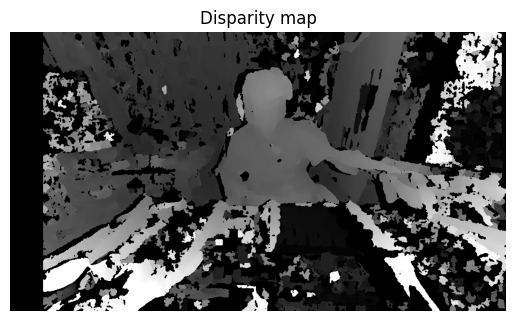

(330419, 3)
(330419, 3)


## Exercise - Project detected keypoints onto the pointcloud

In this exercise your task is to use Mediapipe as shown in the notebook `04_example_mediapipe_pose_estimation`. Then use the keypoints to find the corresponding depth in the pointcloud image. This is equivalent to selecting the 3D points from the pointcloud which correspond to the position of the keypoints in the 2D image.

You can also use the output segmentation mask to only include the detected human in the output pointcloud and only show keypoints which are detected within the mask.

You can use the code below to plot both the poincloud and the detected keypoints which will be larger and in red color.



In [ ]:
from typing import Optional
import plotly.graph_objects as go


# code taken from: https://github.com/cvg/Hierarchical-Localization/blob/master/hloc/utils/viz_3d.py


def init_figure(height: int = 800) -> go.Figure:
    """Initialize a 3D figure."""
    fig = go.Figure()
    axes = dict(
        visible=False,
        showbackground=False,
        showgrid=False,
        showline=False,
        showticklabels=True,
        autorange=True,
    )
    fig.update_layout(
        template="plotly_dark",
        height=height,
        scene_camera=dict(
            eye=dict(x=0., y=-.1, z=-2),
            up=dict(x=0, y=-1., z=0),
            projection=dict(type="orthographic")),
        scene=dict(
            xaxis=axes,
            yaxis=axes,
            zaxis=axes,
            aspectmode='data',
            dragmode='orbit',
        ),
        margin=dict(l=0, r=0, b=0, t=0, pad=0),
        legend=dict(
            orientation="h",
            yanchor="top",
            y=0.99,
            xanchor="left",
            x=0.1
        ),
    )
    return fig


def plot_points(
        fig: go.Figure,
        pts: np.ndarray,
        color: str = 'rgba(255, 0, 0, 1)',
        ps: int = 2,
        colorscale: Optional[str] = None,
        name: Optional[str] = None):
    """Plot a set of 3D points."""
    x, y, z = pts.T
    tr = go.Scatter3d(
        x=x, y=y, z=z, mode='markers', name=name, legendgroup=name,
        marker=dict(
            size=ps, color=color, line_width=0.0, colorscale=colorscale))
    fig.add_trace(tr)


def plot_interactive_pointcloud_with_keypoints(xyz, rgb, keypoints):
  # plots a plotly pointcloud
  # params:
  # xyz - n x 3 - array with 3D coordinates of points
  # rgb - n x 3 - array with RGB triplets in 0-255
  # keypoints - m x 3 array with keypoints to be displayed red with larger points
  fig = init_figure()
  plot_points(fig, xyz, color=rgb)
  plot_points(fig, keypoints, color='red', ps=15)
  fig.show()

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.7/35.7 MB 30.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.6/294.6 kB 17.9 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-metadata 1.15.0 requires protobuf<4.21,>=3.20.3; python_version < "3.11", but you have protobuf 4.25.3 which is incompatible.


/usr/local/lib/python3.10/dist-packages/google/protobuf/symbol_database.py:55: UserWarning:

SymbolDatabase.GetPrototype() is deprecated. Please use message_factory.GetMessageClass() instead. SymbolDatabase.GetPrototype() will be removed soon.



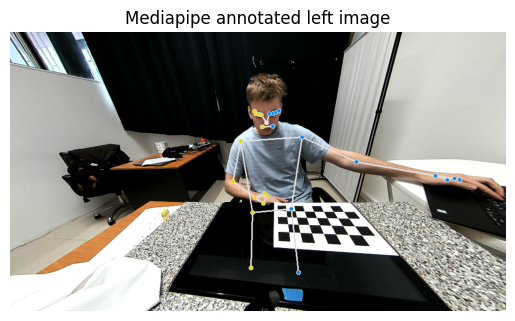

We can also obtain the 2d keypoints image coordinates


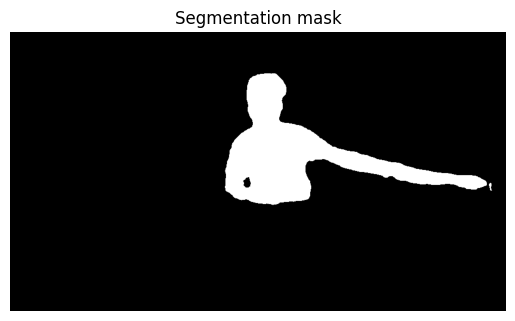

(37758, 3)
(37758, 3)
175 496
[ 0.04373698 -0.25747583  0.6530658 ]
158 502
[ 0.06079601 -0.29551882  0.63738078]
157 509
[ 0.07865654 -0.30382938  0.6458416 ]
155 514
[ 0.09360017 -0.30848968  0.64871204]
160 486
[ 0.01720432 -0.29207121  0.64158332]
159 481
[ 0.00402498 -0.29415547  0.64158332]
158 476
[-0.00982258 -0.29913611  0.6458416 ]
152 520
[ 0.11600368 -0.33703338  0.69011915]
153 473
[-0.01636471 -0.31138444  0.64299649]
182 508
[ 0.08123728 -0.24985686  0.68205702]
183 488
[ 0.0240467  -0.24556348  0.68205702]
203 565
[ 0.25971307 -0.20323504  0.729801  ]
211 446
[-0.11397858 -0.19984305  0.82231104]
251 670
[ 0.50354058 -0.04888012  0.63460958]
289 431
[-0.17270037  0.07102091  0.86112213]
278 823
[0.63693773 0.01504161 0.44500062]
320 473
[-0.0213856   0.16021733  0.7661953 ]
283 860
[0.78123372 0.02705745 0.49310881]
331 490
[0.03310058 0.19095912 0.7465995 ]
286 870
[0.78381491 0.03230518 0.48171684]
317 497
[0.05629672 0.15795344 0.793262  ]
286 846
[-27.83074756  -1.2

## Exercise - Triangulating keypoints

Since we can get detections in both images we can try triangulating the keypoints and displaying them. Note that **this approach is not preferable** due to noise affecting the 3D position significantly.

You can combine the example code from the mediapipe example and yout code for the triangulation exercise.

To make the output easier to understand you can plot only the keypoints with ids: `[0, 11, 12, 13, 14, 15, 16]`.

These are the important pose points as shown in the mediapipe diagram below:
![alt text](https://ai.google.dev/static/mediapipe/images/solutions/pose_landmarks_index.png)

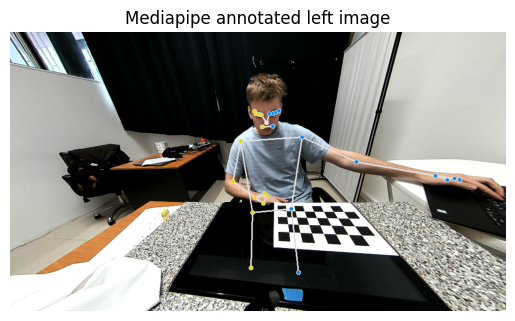

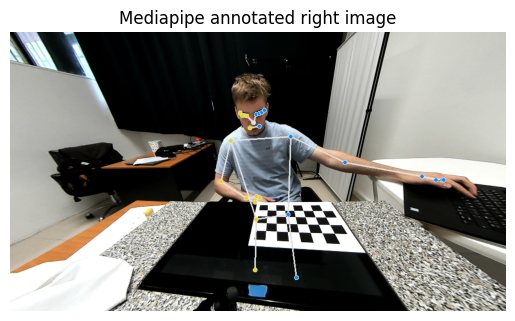

Drawing only keypoints with ids:  [0, 11, 12, 13, 14, 15, 16]
Head, shoulders, elbows, hands
